In [1]:
import os
import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
import cv2
import math
import pandas as pd
from CSL_2025_Python_codes import spim2XYZ, XYZ2Lab, spim2rgb, XYZ2RGB
from functions import *

In [2]:
num_test = 2
num_operator = 3

dark_folder = "dark"
white_folder = "white"

wavelengths = list(range(450, 951, 20))


def load_cube(folder_path):
    tif_files = [f for f in os.listdir(folder_path) if f.lower().endswith(".tif")]
    tif_files.sort()

    cube = []
    for tif_file in tif_files:
        tif_path = os.path.join(folder_path, tif_file)
        tif = tiff.imread(tif_path)
        cube.append(tif)

    cube = np.array(cube)

    return cube


reference_cubes = {}

for i in range(num_test):
    for j in range(num_operator):
        trial = i + 1
        operator = j + 1
        pixel_IC = (300, 380)

        if trial == 1:
            if operator == 1:
                pixel_IC = (300, 380)
            else:
                pixel_IC = (290, 350)

        elif trial == 2:
            if operator == 1:
                pixel_IC = (200, 380)
            else:
                pixel_IC = (300, 380)

        base_folder = "../IDP Group A/test" + str(trial) + "/operator" + str(operator)
        reference_folder = (
            "../IDP Group A/test"
            + str(trial)
            + "/operator"
            + str(operator)
            + "/reference"
        )
        d0_folder = os.path.join(base_folder, "d0")

        dark_cube = load_cube(os.path.join(base_folder, dark_folder))
        white_cube = load_cube(os.path.join(base_folder, white_folder))

        denominator = white_cube - dark_cube
        denominator[denominator == 0] = 1e-6

        reference_cube = load_cube(reference_folder)
        R_reference = (reference_cube - dark_cube) / denominator
        reference_cubes[f"T{trial}O{operator}_reference"] = {
            "reflectance": R_reference,
            "pixel_IC": pixel_IC,
        }

        if os.path.exists(d0_folder):
            d0_cube = load_cube(d0_folder)
            R_d0 = (d0_cube - dark_cube) / denominator
            reference_cubes[f"T{trial}O{operator}_d0"] = {
                "reflectance": R_d0,
                "pixel_IC": pixel_IC,
            }


train_folder = "../IDP Group A/train"

dark_cube = load_cube(os.path.join(train_folder, dark_folder))
white_cube = load_cube(os.path.join(train_folder, white_folder))
train_cube = load_cube(os.path.join(train_folder, "reference"))


denominator = white_cube - dark_cube
denominator[denominator == 0] = 1e-6
R_train = (train_cube - dark_cube) / denominator

reference_cubes[f"train_reference"] = {"reflectance": R_train, "pixel_IC": (192, 305)}

print(len(reference_cubes))

10


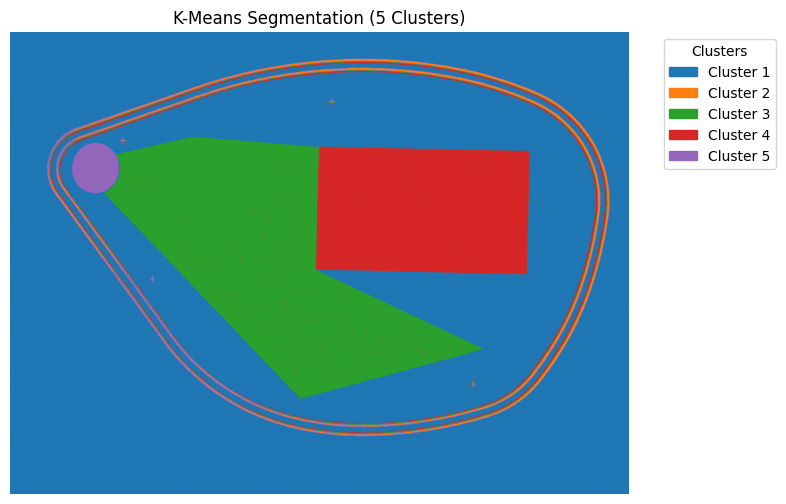

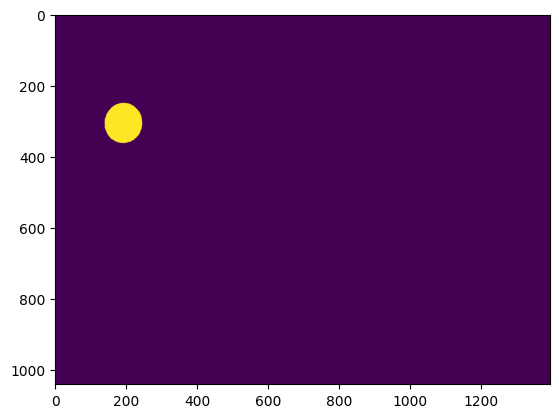

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


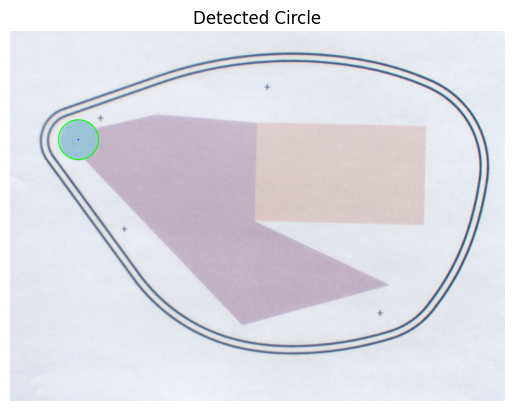

Reflectance shape: (26, 1040, 1392)
RGB shape: (1040, 1392, 3)
Mask shape: (1040, 1392)
Single band shape: (1040, 1392)
Binary shape: (1040, 1392)
circle_info: {'centroid': (191.94872349242382, 305.80067744085903), 'area': 9250.5, 'perimeter': 365.7472541332245, 'min_enclosing_circle': {'center': (192.0, 305.606201171875), 'radius': 56.61511993408203}, 'ellipse': ((191.99717712402344, 305.7432556152344), (105.06371307373047, 112.27347564697266), 5.890912055969238), 'circularity': 0.8689862864489346}


In [3]:
band = 530  # Band for alignment
R_sample = reference_cubes[f"train_reference"]["reflectance"]

R_sample_interp, new_wavelengths = interpolate_spectral_cube(
    R_sample, wavelengths, wl_min=360, wl_max=830, wl_step=10
)
R_sample_interp = np.transpose(R_sample_interp, (1, 2, 0))  # (H, W, bands)

ref_XYZ = spim2XYZ(R_sample_interp, new_wavelengths, "D65")
ref_LAB = XYZ2Lab(ref_XYZ, new_wavelengths, "D65")
ref_rgb = XYZ2RGB(ref_XYZ)

ref_mask = compute_IC_mask(
    ref_rgb, pixel_IC=reference_cubes[f"train_reference"]["pixel_IC"]
)
ref_single_band = R_sample[wavelengths.index(band), :, :]
ref_binary = convert_binary_image(ref_single_band)
ref_circle_info = get_circle_info(ref_mask, ref_rgb, True)
center_pixel = (
    int(ref_circle_info["centroid"][0]),
    int(ref_circle_info["centroid"][1]),
)

circle_center = ref_circle_info["min_enclosing_circle"]["center"]
circle_center = (int(np.round(circle_center[0])), int(np.round(circle_center[1])))
circle_radius = ref_circle_info["min_enclosing_circle"]["radius"]
ref_cropped = crop_circle(ref_rgb, circle_center, circle_radius)
cropped_circles = [ref_cropped]

ref_spectrum = average_reflectance_in_circle(R_sample, circle_center, circle_radius)
spectra = {"reference": ref_spectrum}


mask_ref = np.zeros(ref_LAB.shape[:2], dtype=np.uint8)
cx, cy = int(circle_center[0]), int(circle_center[1])
r = int(circle_radius) - 5
cv2.circle(mask_ref, (cx, cy), r, 1, -1)

ref_cropped = crop_circle(ref_rgb, circle_center, circle_radius)
cropped_circles = [ref_cropped]

print(f"Reflectance shape: {R_sample.shape}")
print(f"RGB shape: {ref_rgb.shape}")
print(f"Mask shape: {ref_mask.shape}")
print(f"Single band shape: {ref_single_band.shape}")
print(f"Binary shape: {ref_binary.shape}")
print(f"circle_info: {ref_circle_info}")

Aligning T1O1_reference...


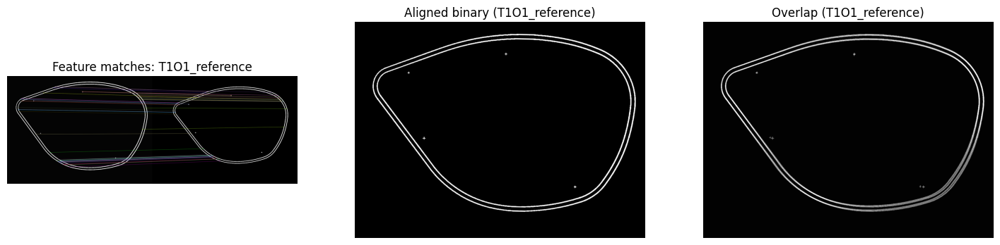

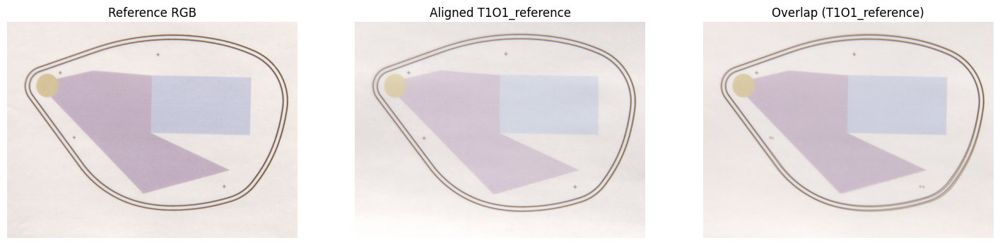

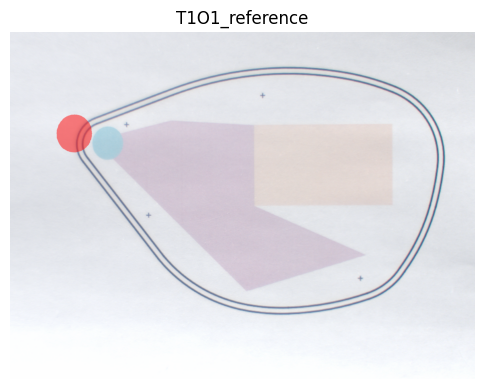

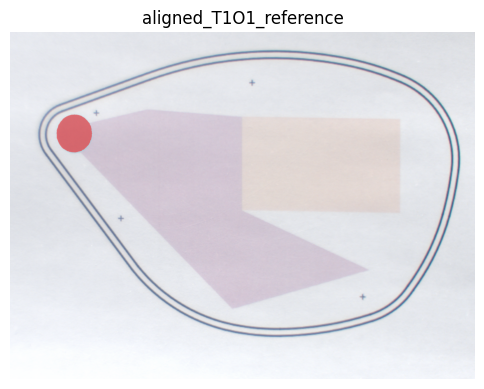

Aligning T1O2_reference...


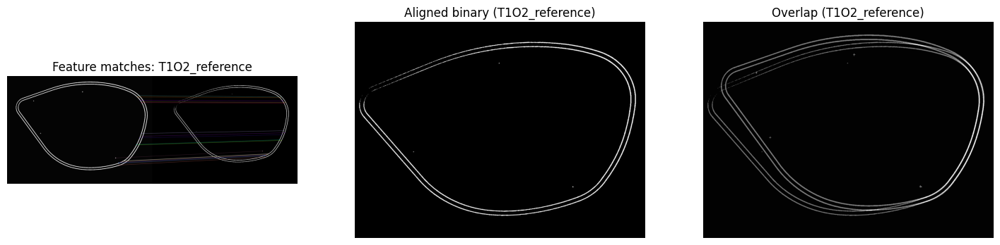

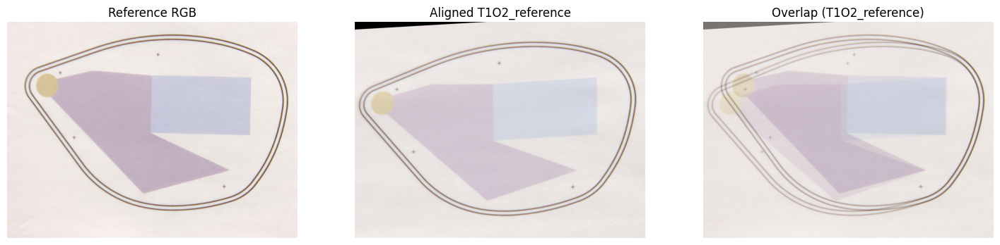

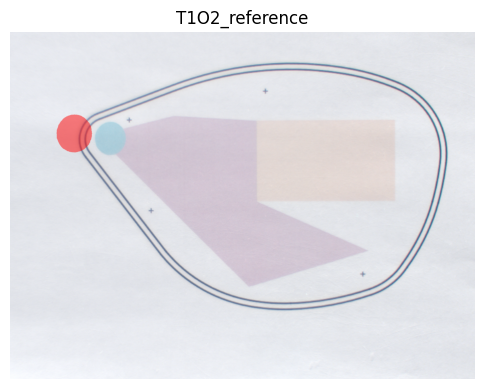

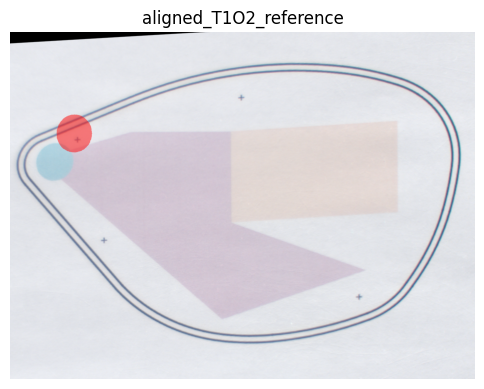

Aligning T1O3_reference...


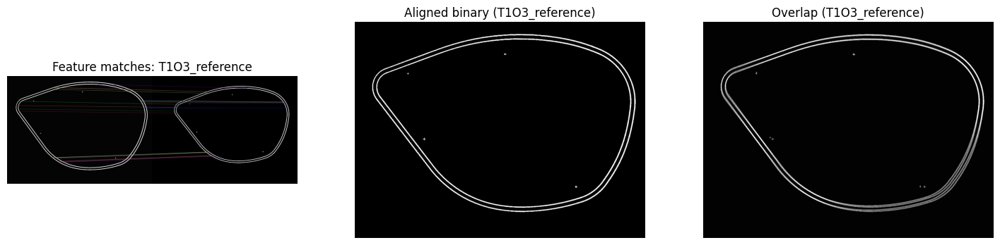

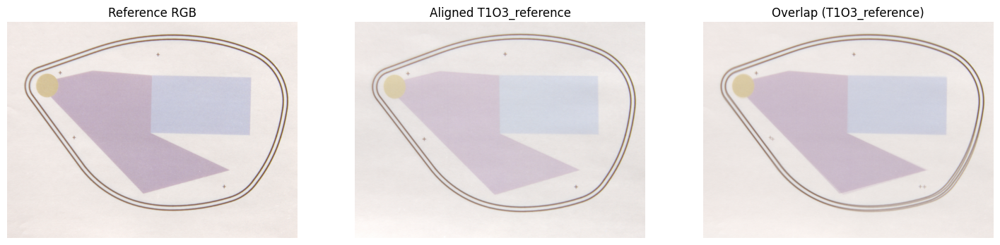

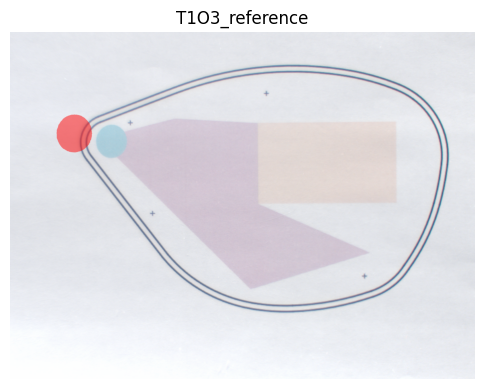

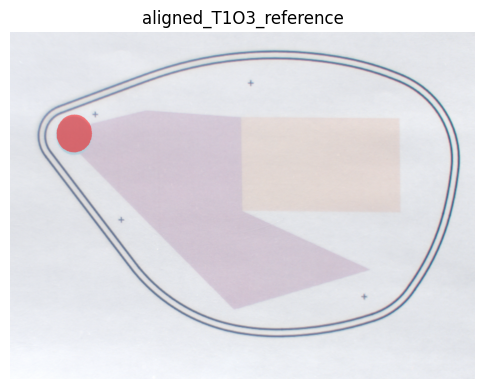

Aligning T2O1_reference...


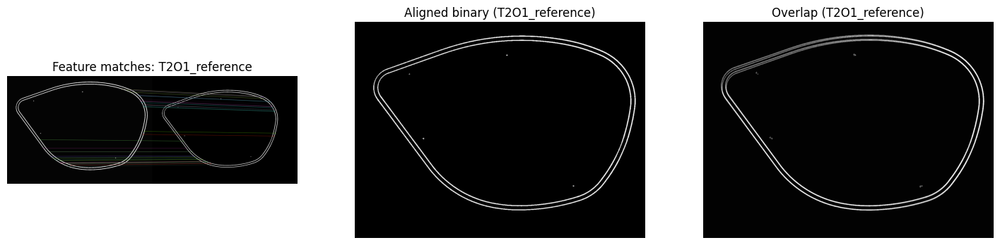

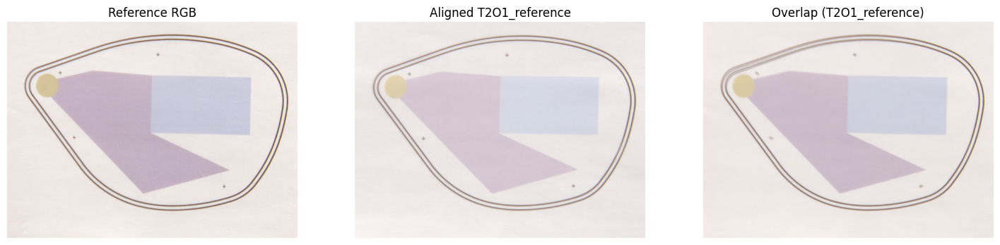

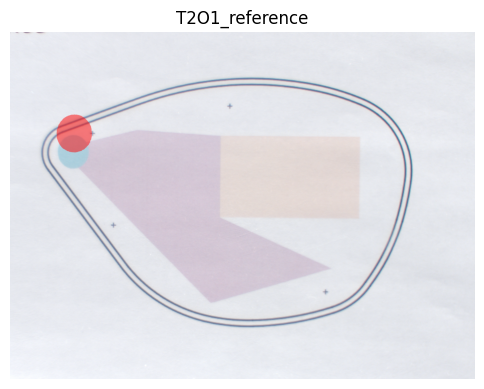

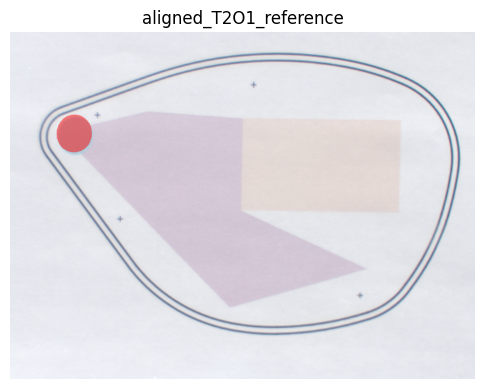

Aligning T2O1_d0...


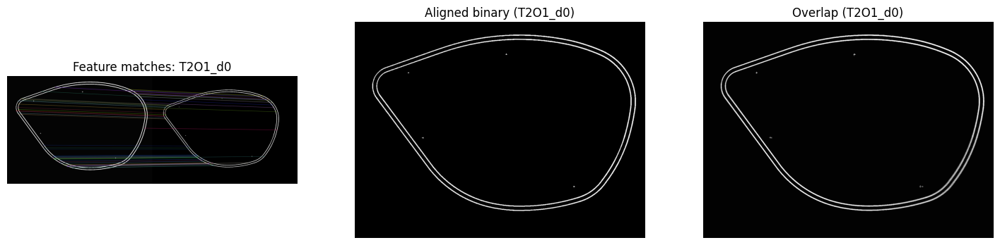

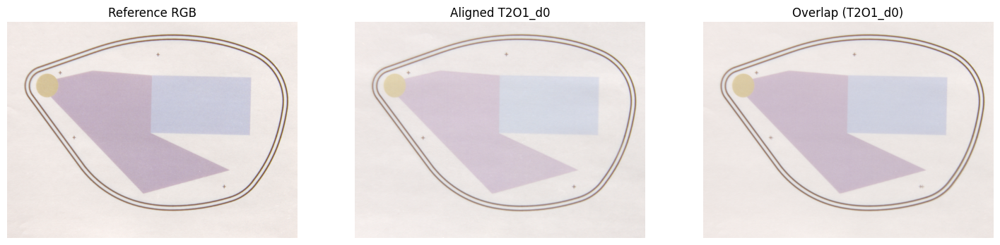

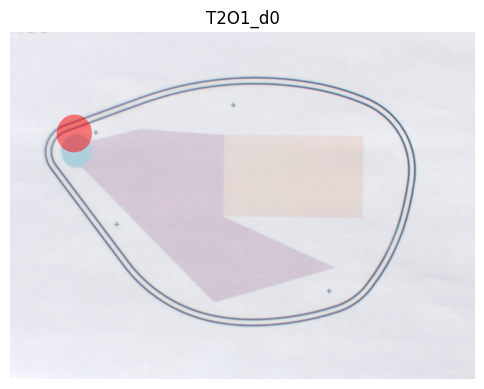

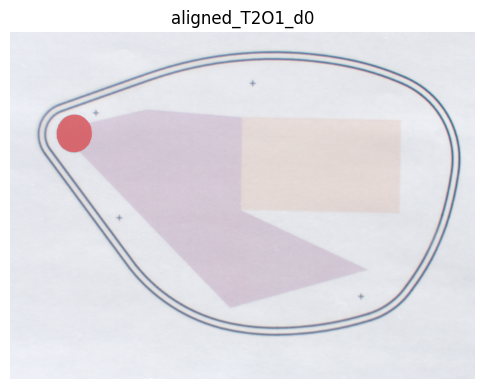

Aligning T2O2_reference...


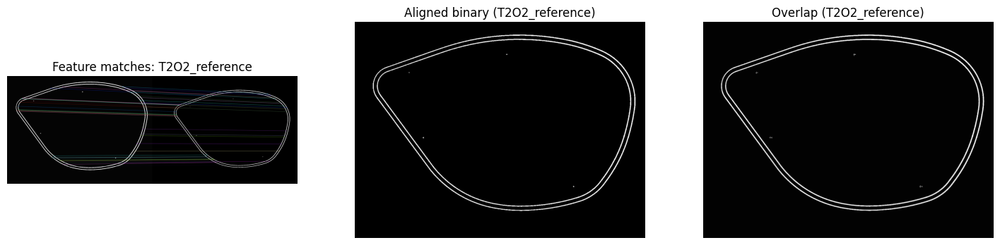

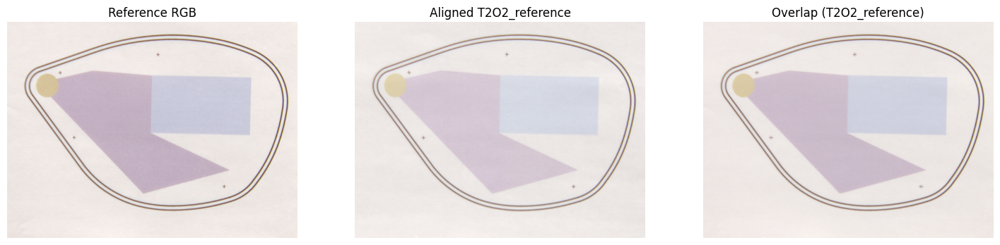

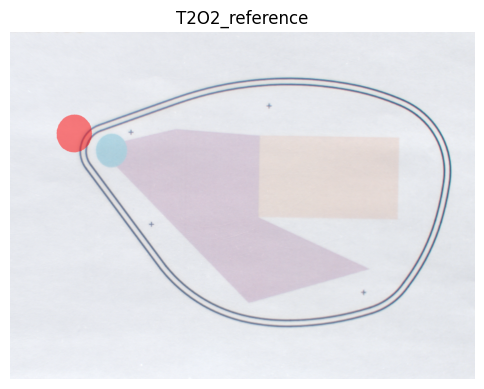

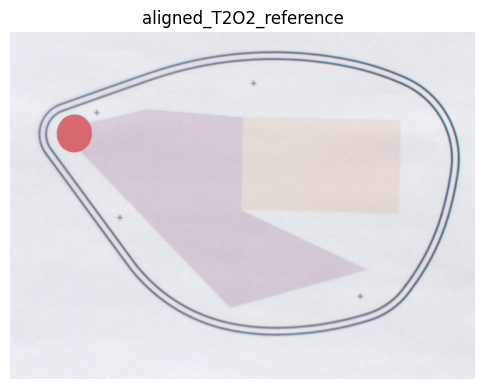

Aligning T2O2_d0...


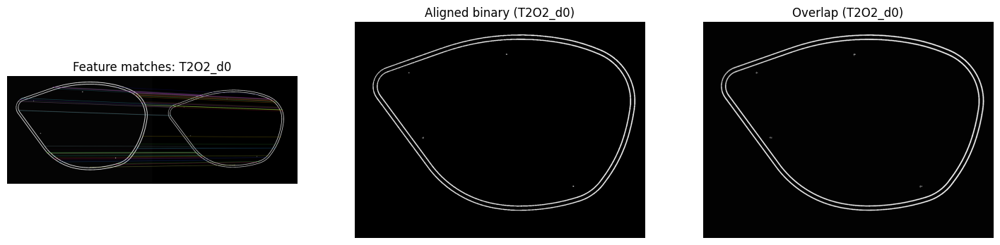

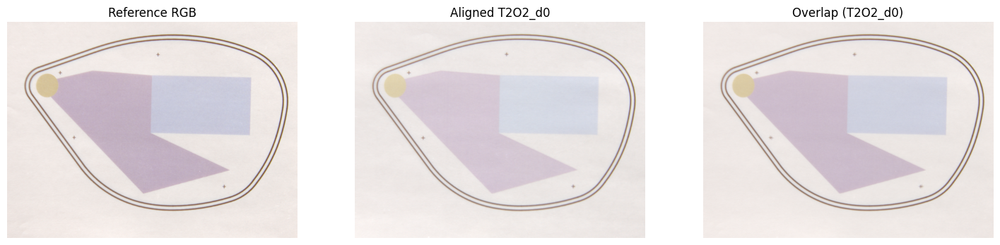

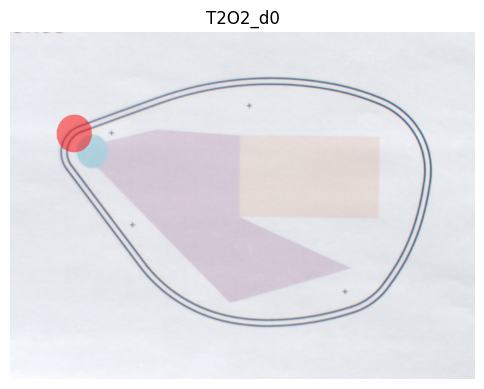

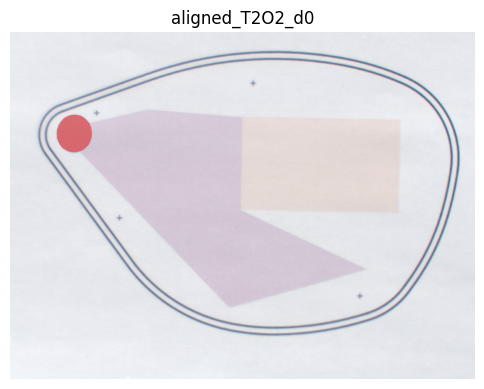

Aligning T2O3_reference...


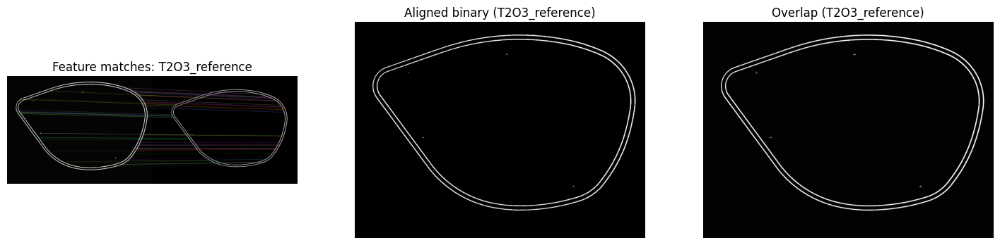

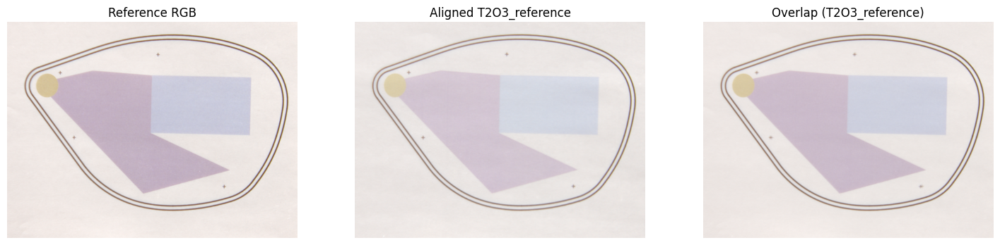

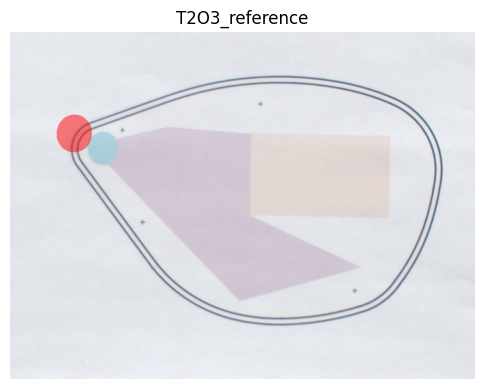

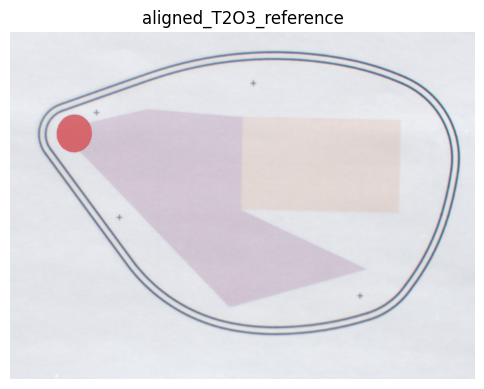

Aligning T2O3_d0...


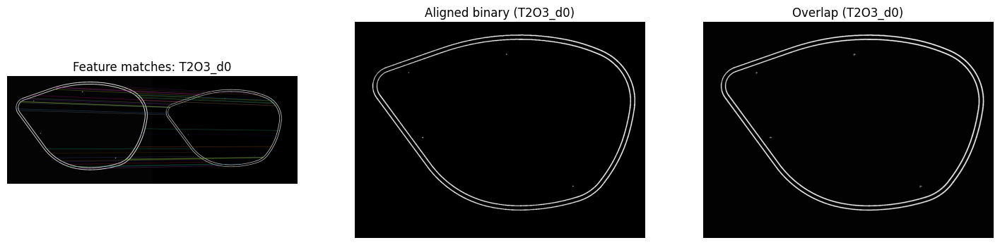

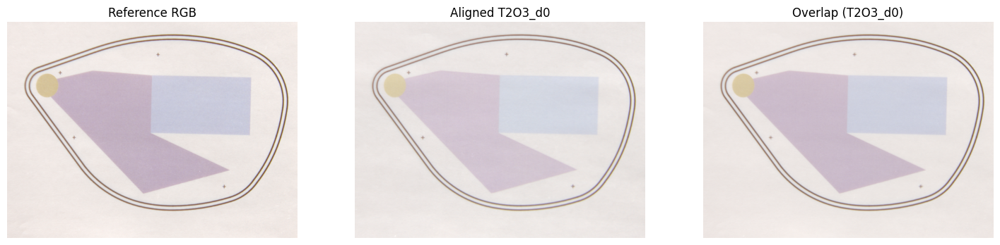

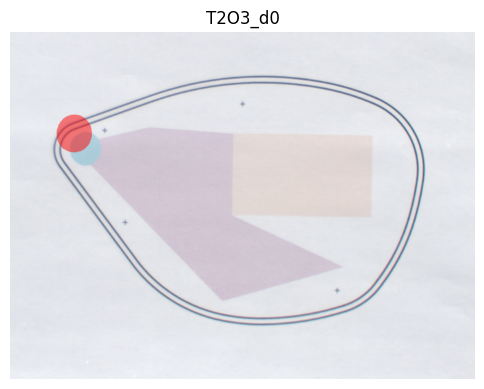

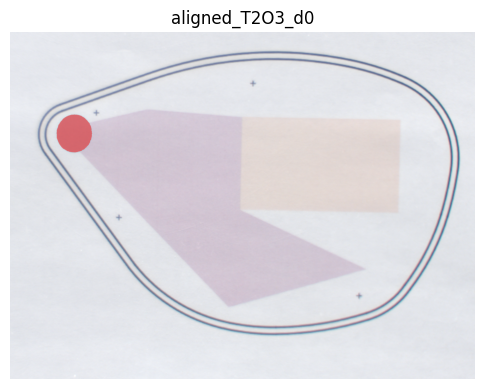

Aligning train_reference...


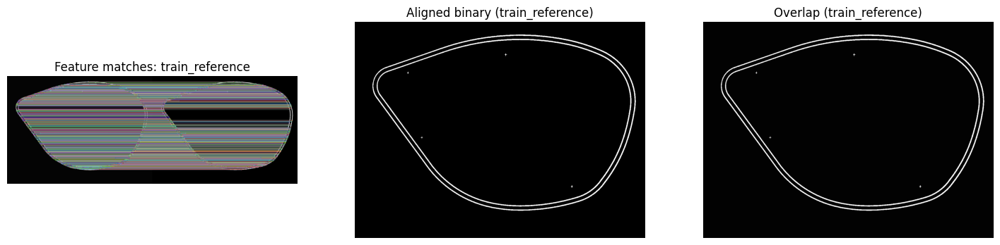

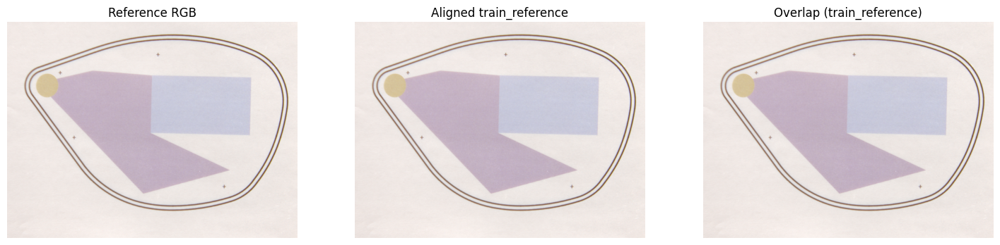

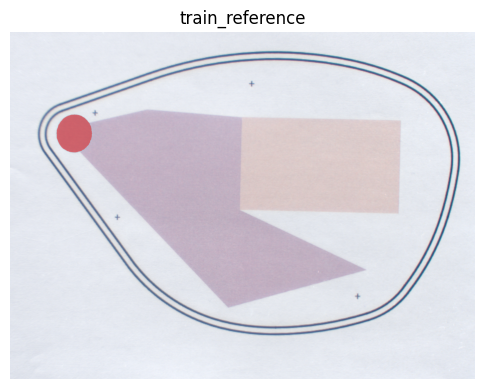

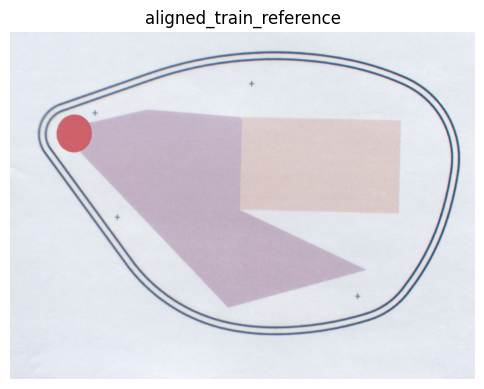

In [4]:
homographies = []
reference_keys = list(reference_cubes.keys())


def get_example_reflectance(cubes, sample_name, wavelength):
    wavelengths = list(range(450, 951, 20))

    # Get reflectance cube
    R = cubes[sample_name]["reflectance"]

    # Extract 2D image at selected wavelength
    reflectance_image = R[wavelengths.index(wavelength), :, :]

    return reflectance_image


def align_and_visualise_homography(
    img_ref,
    img_to_align,
    defect,
    n_features=8000,
    visualise=True,
    mode="affine",  # "similarity" or "affine"
):
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    img_to_align = clahe.apply(img_to_align)
    img_ref = clahe.apply(img_ref)

    # Histogram equalisation for better feature contrast
    img_to_align = cv2.equalizeHist(img_to_align)

    # ORB feature detection
    orb = cv2.ORB_create(n_features)
    kp1, des1 = orb.detectAndCompute(img_ref, None)
    kp2, des2 = orb.detectAndCompute(img_to_align, None)

    # Match descriptors with Lowe’s ratio test
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches_raw = bf.knnMatch(des1, des2, k=2)
    matches = [m for m, n in matches_raw if m.distance < 0.75 * n.distance]

    if len(matches) < 10:
        print(f"Not enough matches for {defect}")
        return None

    # Extract corresponding points
    pts_ref = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 2)
    pts_to = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 2)

    # Estimate transform
    if mode == "affine":
        M, mask = cv2.estimateAffine2D(
            pts_to, pts_ref, method=cv2.RANSAC, ransacReprojThreshold=5.0
        )
    else:  # similarity mode (original)
        M, mask = cv2.estimateAffinePartial2D(
            pts_to, pts_ref, method=cv2.RANSAC, ransacReprojThreshold=5.0
        )

    if M is None:
        print(f"Transformation estimation failed for {defect}")
        return None

    # Warp image
    aligned = cv2.warpAffine(img_to_align, M, (img_ref.shape[1], img_ref.shape[0]))

    # Visualisation
    if visualise:
        matches_inliers = [m for m, inlier in zip(matches, mask.ravel()) if inlier]
        match_vis = cv2.drawMatches(
            cv2.cvtColor(img_ref, cv2.COLOR_GRAY2BGR),
            kp1,
            cv2.cvtColor(img_to_align, cv2.COLOR_GRAY2BGR),
            kp2,
            matches_inliers,
            None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        )

        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(match_vis)
        plt.title(f"Feature matches: {defect}")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(aligned, cmap="gray")
        plt.title(f"Aligned binary ({defect})")
        plt.axis("off")

        overlay = cv2.addWeighted(
            cv2.cvtColor(img_ref, cv2.COLOR_GRAY2BGR),
            0.5,
            cv2.cvtColor(aligned, cv2.COLOR_GRAY2BGR),
            0.5,
            0,
        )
        plt.subplot(1, 3, 3)
        plt.imshow(overlay)
        plt.title(f"Overlap ({defect})")
        plt.axis("off")

        plt.show()

    return M


for reference_key in reference_keys:
    print(f"Aligning {reference_key}...")

    # Spectral to XYZ to LAB
    cube_interp, _ = interpolate_spectral_cube(
        reference_cubes[reference_key]["reflectance"],
        wavelengths,
        wl_min=360,
        wl_max=830,
        wl_step=10,
    )
    cube_interp = np.transpose(cube_interp, (1, 2, 0))  # (H, W, b)

    def_XYZ = spim2XYZ(cube_interp, new_wavelengths, "D65")
    reference_key_rgb = XYZ2RGB(def_XYZ)

    reference_key_binary = convert_binary_image(
        get_example_reflectance(reference_cubes, reference_key, band)
    )
    H = align_and_visualise_homography(
        ref_binary, reference_key_binary, reference_key, visualise=True
    )
    homographies.append(H)

    if ref_rgb.dtype != np.uint8:
        ref_rgb = np.clip(ref_rgb * 255, 0, 255).astype(np.uint8)
    if reference_key_rgb.dtype != np.uint8:
        reference_key_rgb = np.clip(reference_key_rgb * 255, 0, 255).astype(np.uint8)

    aligned_reference_key, _ = align_and_blend_RGB_homography(
        ref_rgb, reference_key_rgb, H, reference_key
    )
    overlay_mask(reference_key_rgb, ref_mask, reference_key, color=(1, 0, 0), alpha=0.5)
    overlay_mask(
        aligned_reference_key,
        ref_mask,
        f"aligned_{reference_key}",
        color=(1, 0, 0),
        alpha=0.5,
    )

(0, 'T1O1_reference')
Processing (0, 'T1O1_reference')...
[[ 1.20407582e+00  2.84494604e-03 -2.28469599e+02]
 [-7.04112791e-02  1.12659740e+00  5.05264839e+01]]


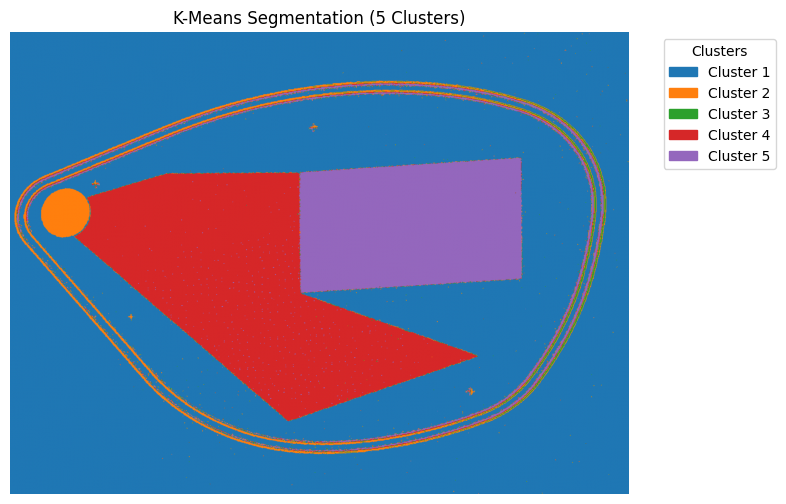

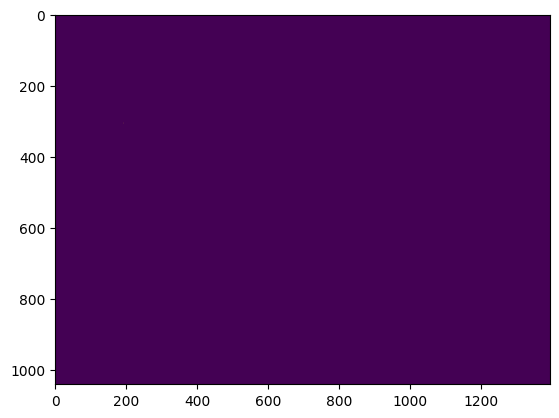

TypeError: 'NoneType' object is not subscriptable

In [11]:
deltaE_results = []
reference_radius = []
reference_aligned = []

for reference_key in enumerate(reference_keys):
    print(reference_key)
    print(f"Processing {reference_key}...")

    # Spectral to XYZ to RGB
    cube_interp, _ = interpolate_spectral_cube(
        reference_cubes[reference_key[1]]["reflectance"],
        wavelengths,
        wl_min=360,
        wl_max=830,
        wl_step=10,
    )
    cube_interp = np.transpose(cube_interp, (1, 2, 0))  # (H, W, b)

    def_XYZ = spim2XYZ(cube_interp, new_wavelengths, "D65")
    rgb_vis = XYZ2RGB(def_XYZ)

    # Align defect
    A_3x3 = homographies[i]
    print(A_3x3)
    A_2x3 = A_3x3[:2, :]
    defect_rgb = spim2rgb(reference_cubes[reference_key[1]]["reflectance"], wavelengths)
    h, w, b = defect_rgb.shape
    aligned_defect = cv2.warpAffine(defect_rgb, A_2x3, (w, h))
    reference_aligned.append(aligned_defect)

    # Compute defect mask of IC to find circle radius
    defect_mask = compute_IC_mask(defect_rgb, A_2x3, True, circle_center)
    defect_circle_info = get_circle_info(defect_mask, aligned_defect, True)
    reference_radius.append(defect_circle_info["min_enclosing_circle"]["radius"])

    # Masked CTQ for visualization
    aligned_vis = cv2.warpAffine(rgb_vis, A_2x3, (w, h))
    cropped_circle = crop_circle(aligned_vis, circle_center, circle_radius)
    cropped_circles.append(cropped_circle)

    # CTQ1 (all spectra)
    # Compute spectral average
    cube = reference_cubes[reference_key]["reflectance"]
    bands, h, w = cube.shape

    # Align full cube
    cube_aligned = np.stack(
        [cv2.warpAffine(cube[j], A_3x3[:2, :], (w, h)) for j in range(bands)]
    )

    # Spectral to XYZ to LAB
    cube_interp, _ = interpolate_spectral_cube(
        cube_aligned, wavelengths, wl_min=360, wl_max=830, wl_step=10
    )
    cube_interp = np.transpose(cube_interp, (1, 2, 0))  # (H, W, b)

    def_XYZ = spim2XYZ(cube_interp, new_wavelengths, "D65")
    def_LAB = XYZ2Lab(def_XYZ, new_wavelengths, "D65")

    # CIelab delta E with reference
    DE_mean = calculate_delta_E(ref_LAB, def_LAB, mask=mask_ref)
    deltaE_results.append(DE_mean)

In [ ]:
# Save results to df
result_reference = pd.DataFrame()
result_reference["defect_id"] = reference_keys
result_reference["DE_mean"] = deltaE_results
result_reference["D_radius"] = abs(np.array(defects_radius) - circle_radius)

result_reference["CTQ1"] = np.array(deltaE_results) > 2.8
result_reference["CTQ2"] = (
    abs(np.array(defects_radius) - circle_radius) > 1.2
)  # new reference  50

result_reference["Defect?"] = result_reference["CTQ1"] | result_reference["CTQ2"]

result_reference.to_csv(f"reference.csv", index=False)
print("\nAverage DE (CIE2000) values per defect:")
print(result_reference)